In [1]:
import pandas as pd
import numpy as np
import statistics as st
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression

In [2]:
red_wine = pd.read_csv("winequality-red.csv", sep=";")
red_wine

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [3]:
red_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [4]:
white_wine = pd.read_csv("winequality-white.csv", sep=";")
white_wine

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [5]:
red_wine["wine_type"] = "red"
white_wine["wine_type"] = "white"


In [6]:
red_wine
white_wine


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,white
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,white
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,white
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,white
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,white
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white


In [7]:
red_wine['quality_label'] = red_wine['quality'].apply(lambda value: 'low' if value <= 5 else 'medium' if value <= 7 else 'high')
white_wine['quality_label'] = white_wine['quality'].apply(lambda value: 'low' if value <= 5 else 'medium' if value <= 7 else 'high')

In [8]:
wines = pd.concat([white_wine,red_wine])
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label
0,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,white,medium
1,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,white,medium
2,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,white,medium
3,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,white,medium
4,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,white,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,red,low
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,red,medium
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,red,medium
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,red,low


In [9]:
wines = wines.sample(frac=1, random_state=42).reset_index(drop=True)
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label
0,7.0,0.25,0.45,2.3,0.045,40.0,118.0,0.99064,3.16,0.48,11.9,7,white,medium
1,7.6,0.14,0.74,1.6,0.040,27.0,103.0,0.99160,3.07,0.40,10.8,7,white,medium
2,6.2,0.15,0.27,11.0,0.035,46.0,116.0,0.99602,3.12,0.38,9.1,6,white,medium
3,6.7,0.16,0.32,12.5,0.035,18.0,156.0,0.99666,2.88,0.36,9.0,6,white,medium
4,6.8,0.27,0.22,17.8,0.034,16.0,116.0,0.99890,3.07,0.53,9.2,5,white,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.3,0.24,0.29,13.7,0.035,53.0,134.0,0.99567,3.17,0.38,10.6,6,white,medium
6493,6.9,0.36,0.25,2.4,0.098,5.0,16.0,0.99640,3.41,0.60,10.1,6,red,medium
6494,13.4,0.27,0.62,2.6,0.082,6.0,21.0,1.00020,3.16,0.67,9.7,6,red,medium
6495,8.9,0.40,0.51,2.6,0.052,13.0,27.0,0.99500,3.32,0.90,13.4,7,red,medium


In [10]:
des = pd.merge(red_wine.describe(), white_wine.describe(),left_index=True, right_index=True, suffixes=(' R', ' W')).T
des = des.sort_index()
des

,count,mean,std,min,25%,50%,75%,max
alcohol R,1599.0,10.422983,1.065668,8.40000,9.500000,10.20000,11.100000,14.90000
alcohol W,4898.0,10.514267,1.230621,8.00000,9.500000,10.40000,11.400000,14.20000
chlorides R,1599.0,0.087467,0.047065,0.01200,0.070000,0.07900,0.090000,0.61100
chlorides W,4898.0,0.045772,0.021848,0.00900,0.036000,0.04300,0.050000,0.34600
citric acid R,1599.0,0.270976,0.194801,0.00000,0.090000,0.26000,0.420000,1.00000
citric acid W,4898.0,0.334192,0.121020,0.00000,0.270000,0.32000,0.390000,1.66000
density R,1599.0,0.996747,0.001887,0.99007,0.995600,0.99675,0.997835,1.00369
density W,4898.0,0.994027,0.002991,0.98711,0.991723,0.99374,0.996100,1.03898
fixed acidity R,1599.0,8.319637,1.741096,4.60000,7.100000,7.90000,9.200000,15.90000
fixed acidity W,4898.0,6.854788,0.843868,3.80000,6.300000,6.80000,7.300000,14.20000


In [11]:
wines.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label
0,7.0,0.25,0.45,2.3,0.045,40.0,118.0,0.99064,3.16,0.48,11.9,7,white,medium
1,7.6,0.14,0.74,1.6,0.040,27.0,103.0,0.99160,3.07,0.40,10.8,7,white,medium
2,6.2,0.15,0.27,11.0,0.035,46.0,116.0,0.99602,3.12,0.38,9.1,6,white,medium
3,6.7,0.16,0.32,12.5,0.035,18.0,156.0,0.99666,2.88,0.36,9.0,6,white,medium
4,6.8,0.27,0.22,17.8,0.034,16.0,116.0,0.99890,3.07,0.53,9.2,5,white,low


In [12]:
wines.isnull().any()

fixed acidity           False
volatile acidity        False
citric acid             False
residual sugar          False
chlorides               False
free sulfur dioxide     False
total sulfur dioxide    False
density                 False
pH                      False
sulphates               False
alcohol                 False
quality                 False
wine_type               False
quality_label           False
dtype: bool

In [13]:
wines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  wine_type             6497 non-null   object 
 13  quality_label         6497 non-null   object 
dtypes: float64(11), int64(1), object(2)
memory usage: 710.7+ KB


In [14]:
wines.shape[0]

6497

In [15]:
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label
0,7.0,0.25,0.45,2.3,0.045,40.0,118.0,0.99064,3.16,0.48,11.9,7,white,medium
1,7.6,0.14,0.74,1.6,0.040,27.0,103.0,0.99160,3.07,0.40,10.8,7,white,medium
2,6.2,0.15,0.27,11.0,0.035,46.0,116.0,0.99602,3.12,0.38,9.1,6,white,medium
3,6.7,0.16,0.32,12.5,0.035,18.0,156.0,0.99666,2.88,0.36,9.0,6,white,medium
4,6.8,0.27,0.22,17.8,0.034,16.0,116.0,0.99890,3.07,0.53,9.2,5,white,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.3,0.24,0.29,13.7,0.035,53.0,134.0,0.99567,3.17,0.38,10.6,6,white,medium
6493,6.9,0.36,0.25,2.4,0.098,5.0,16.0,0.99640,3.41,0.60,10.1,6,red,medium
6494,13.4,0.27,0.62,2.6,0.082,6.0,21.0,1.00020,3.16,0.67,9.7,6,red,medium
6495,8.9,0.40,0.51,2.6,0.052,13.0,27.0,0.99500,3.32,0.90,13.4,7,red,medium


In [16]:
#number of row -> number of wines
n_wines= wines.shape[0]

#categorization of wines High, medium, low
high = wines.loc[(wines['quality'] > 7)]
n_above_7 = high.shape[0]
low = wines.loc[(wines['quality'] < 5)]
n_below_5 = low.shape[0]
medium = wines.loc[(wines['quality'] >= 5) & (wines['quality'] <= 7)]
n_between = medium.shape[0]

#% of wines per category  
high_percent = n_above_7*100/n_wines

print("Total number of wine data: {}".format(n_wines))
print("Wines with rating 8 and above: {}".format(n_above_7))
print("Wines with rating less than 5: {}".format(n_below_5))
print("Wines with rating 5 to 7: {}".format(n_between))
print("Percentage of wines with quality 7 and above: {:.2f}%".format(high_percent))

Total number of wine data: 6497
Wines with rating 8 and above: 198
Wines with rating less than 5: 246
Wines with rating 5 to 7: 6053
Percentage of wines with quality 7 and above: 3.05%


In [17]:
n_wines_r= red_wine.shape[0]

#categorization of red wines High, medium, low
high_r = red_wine.loc[(red_wine['quality'] > 7)]
n_above_7_r = high_r.shape[0]
low_r = red_wine.loc[(red_wine['quality'] < 5)]
n_below_5_r = low_r.shape[0]
medium_r = red_wine.loc[(red_wine['quality'] >= 5) & (red_wine['quality'] <= 7)]
n_between_r = medium_r.shape[0]

#% of red wines per category  
high_r_percent = n_above_7_r*100/n_wines_r

print("Total number of red wine data: {}".format(n_wines_r))
print("Wines with rating 8 and above: {}".format(n_above_7_r))
print("Wines with rating less than 5: {}".format(n_below_5_r))
print("Wines with rating 5 to 7: {}".format(n_between_r))
print("Percentage of wines with quality 7 and above: {:.2f}%".format(high_r_percent))

Total number of red wine data: 1599
Wines with rating 8 and above: 18
Wines with rating less than 5: 63
Wines with rating 5 to 7: 1518
Percentage of wines with quality 7 and above: 1.13%


In [18]:
n_wines_w= white_wine.shape[0]

#categorization of white wines High, medium, low
high_w = white_wine.loc[(white_wine['quality'] > 7)]
n_above_7_w = high_w.shape[0]
low_w = white_wine.loc[(white_wine['quality'] < 5)]
n_below_5_w = low_w.shape[0]
medium_w = white_wine.loc[(white_wine['quality'] >= 5) & (white_wine['quality'] <= 7)]
n_between_w = medium_w.shape[0]

#% of white wines per category  
high_w_percent = n_above_7*100/n_wines

print("Total number of red wine data: {}".format(n_wines_w))
print("Wines with rating 8 and above: {}".format(n_above_7_w))
print("Wines with rating less than 5: {}".format(n_below_5_w))
print("Wines with rating 5 to 7: {}".format(n_between_w))
print("Percentage of wines with quality 7 and above: {:.2f}%".format(high_w_percent))

Total number of red wine data: 4898
Wines with rating 8 and above: 180
Wines with rating less than 5: 183
Wines with rating 5 to 7: 4535
Percentage of wines with quality 7 and above: 3.05%


In [19]:
white_wine.shape[0]
red_wine.shape[0]
wines.shape[0]
percent_red = red_wine.shape[0]*100/wines.shape[0]
percent_white = white_wine.shape[0]*100/wines.shape[0]

print ("percent red: {}%".format(percent_red))
print ("percent white: {}%".format(percent_white))

percent red: 24.61135908881022%
percent white: 75.38864091118978%


In [20]:
white_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [21]:
red_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [22]:

#categorization of white wines High, medium, low
high_w = white_wine.loc[(white_wine['quality'] > 7)]
low_w = white_wine.loc[(white_wine['quality'] < 5)]
medium_w = white_wine.loc[(white_wine['quality'] >= 5) & (white_wine['quality'] <= 7)]


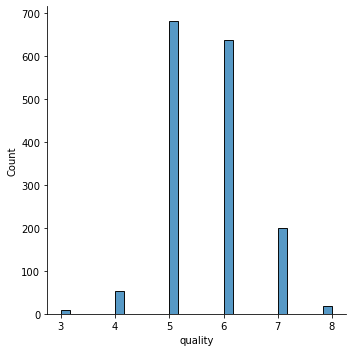

In [23]:
sns.displot(red_wine, x="quality")

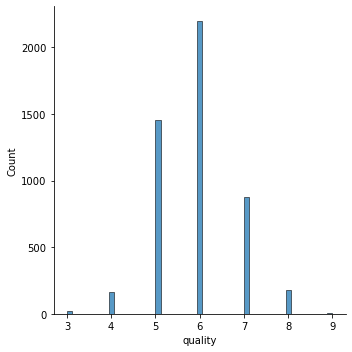

In [24]:
sns.displot(white_wine, x="quality")

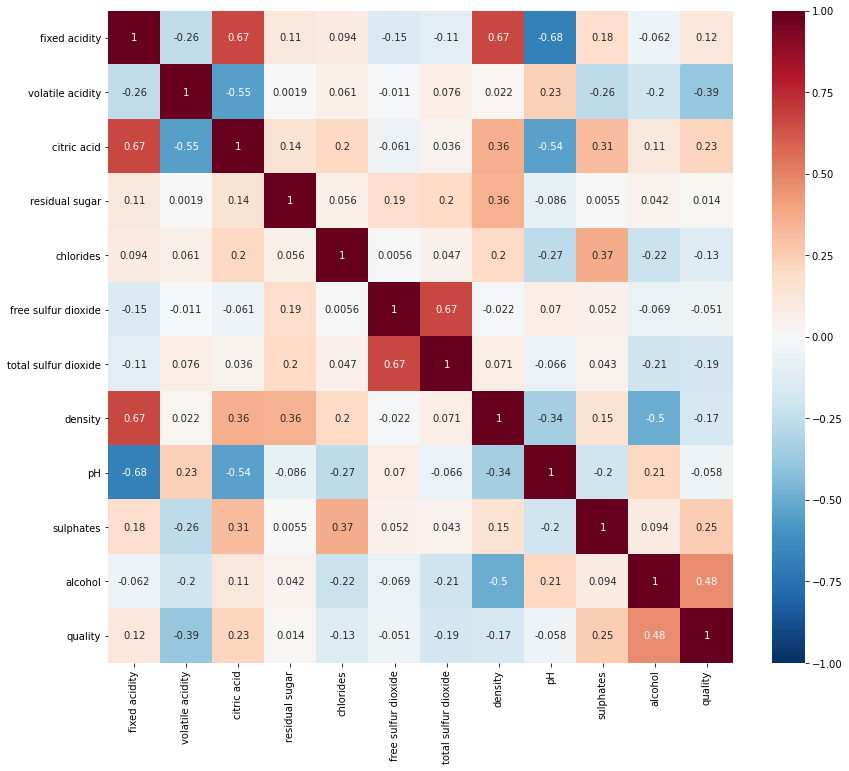

In [25]:
correlation_r = red_wine.corr()
# display(correlation) between features
plt.figure(figsize=(14, 12))
heatmap = sns.heatmap(correlation_r, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")
heatmap

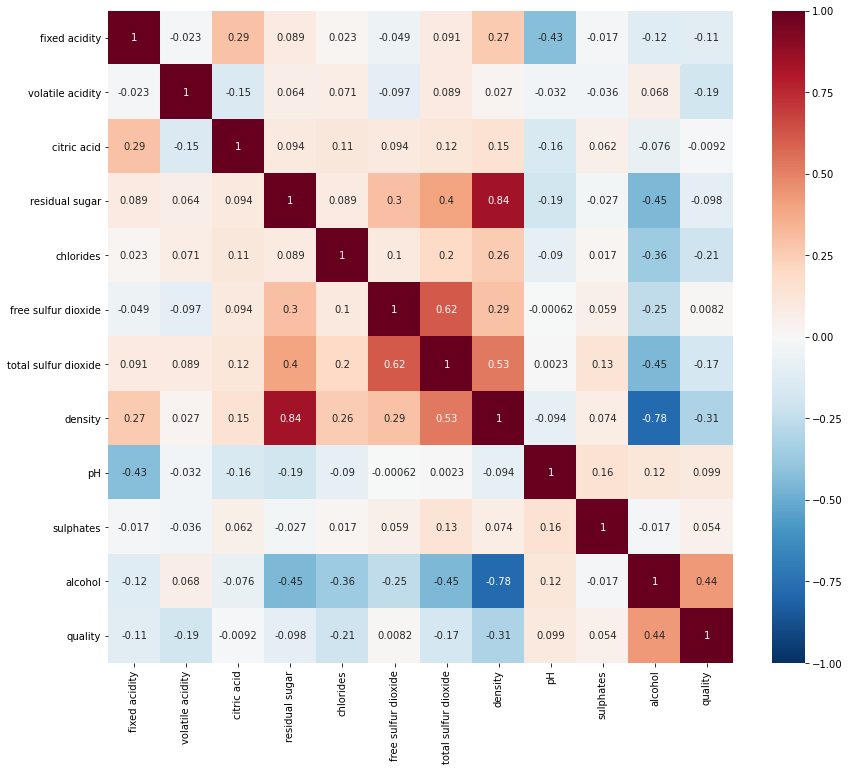

In [26]:
correlation_w = white_wine.corr()
# display(correlation) between features
plt.figure(figsize=(14, 12))
heatmap = sns.heatmap(correlation_w, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")
heatmap

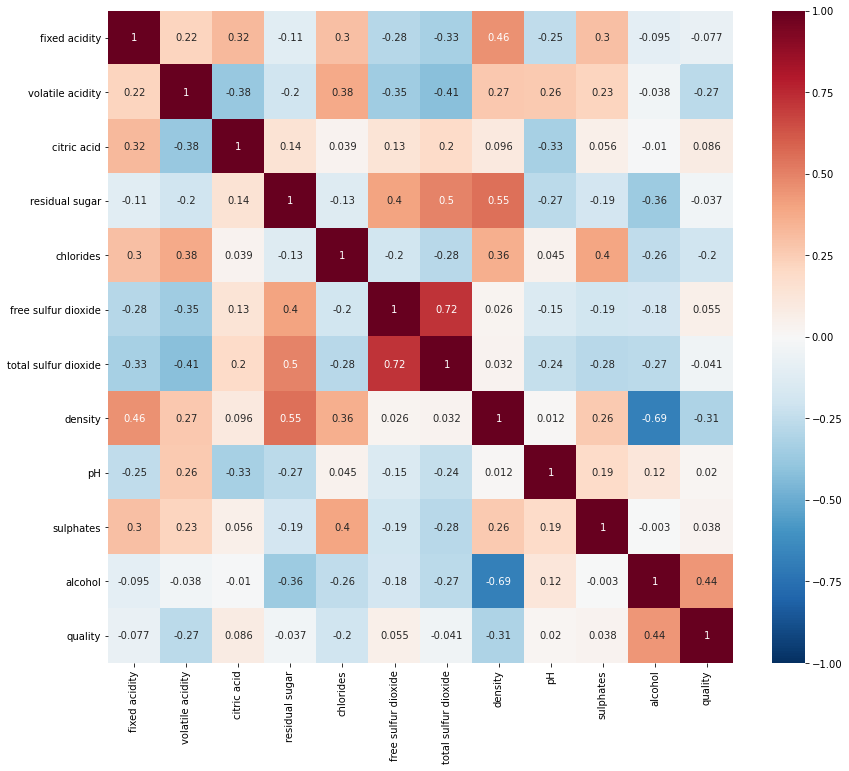

In [27]:
correlation_w = wines.corr()
# display(correlation) between features
plt.figure(figsize=(14, 12))
heatmap = sns.heatmap(correlation_w, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")
heatmap

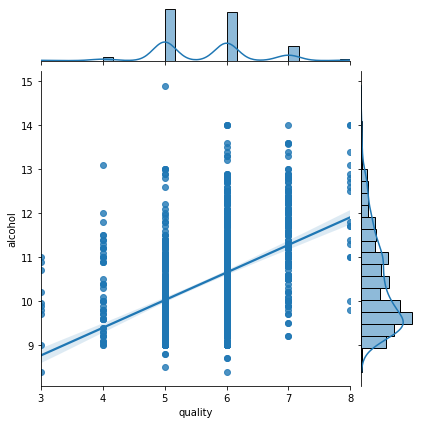

In [28]:
sns.jointplot(x="quality", y="alcohol",data=red_wine, kind="reg")
#Definition. A regression line is a straight line that de- scribes how a response variable y changes as an explanatory variable x changes. We often use a regression line to predict the value of y for a given value of x.

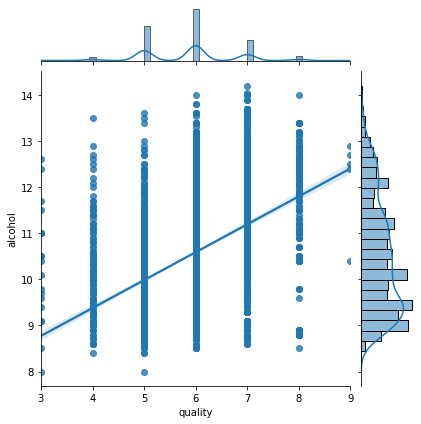

In [29]:
sns.jointplot(x="quality", y="alcohol",data=white_wine, kind="reg")

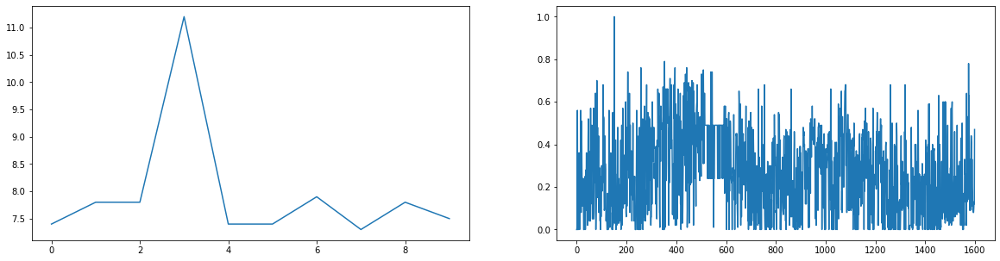

In [30]:
#to modify
fig,ax=plt.subplots(nrows=1,ncols=2,figsize=(20,5)) 

#manipulating the first Axes 
ax[0].plot(red_wine.index[0:10],red_wine["fixed acidity"][0:10]) 
ax[1].plot(red_wine.index,red_wine["citric acid"])

In [31]:
#subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
#left  = 0.125  # the left side of the subplots of the figure
#right = 0.9    # the right side of the subplots of the figure
#bottom = 0.1   # the bottom of the subplots of the figure
#top = 0.9      # the top of the subplots of the figure
#wspace = 0.2   # the amount of width reserved for blank space between subplots
#hspace = 0.2   # the amount of height reserved for white space between subplots

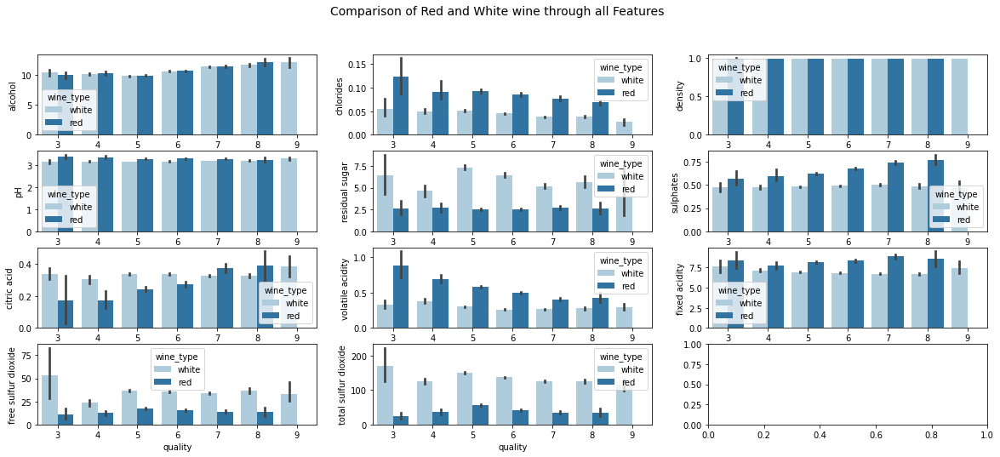

In [32]:
fig, axs = plt.subplots(nrows=4, ncols=3,figsize=(20,8))
title = fig.suptitle("Comparison of Red and White wine through all Features", fontsize=14)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
sns.set_palette(sns.color_palette("Paired"))
sns.barplot(x="quality",y="alcohol",data=wines, hue="wine_type", ax=axs[0,0])
sns.barplot(x="quality",y="chlorides",data=wines, hue="wine_type", ax=axs[0,1])
sns.barplot(x="quality",y="density",data=wines, hue="wine_type", ax=axs[0,2])
sns.barplot(x="quality",y="pH",data=wines, hue="wine_type", ax=axs[1,0])
sns.barplot(x="quality",y="residual sugar",data=wines, hue="wine_type", ax=axs[1,1])
sns.barplot(x="quality",y="sulphates",data=wines, hue="wine_type", ax=axs[1,2])
sns.barplot(x="quality",y="citric acid",data=wines, hue="wine_type", ax=axs[2,0])
sns.barplot(x="quality",y="volatile acidity",data=wines, hue="wine_type", ax=axs[2,1])
sns.barplot(x="quality",y="fixed acidity",data=wines, hue="wine_type", ax=axs[2,2])
sns.barplot(x="quality",y="free sulfur dioxide",data=wines, hue="wine_type", ax=axs[3,0])
sns.barplot(x="quality",y="total sulfur dioxide",data=wines, hue="wine_type", ax=axs[3,1])


In [33]:
white_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [34]:
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label
0,7.0,0.25,0.45,2.3,0.045,40.0,118.0,0.99064,3.16,0.48,11.9,7,white,medium
1,7.6,0.14,0.74,1.6,0.040,27.0,103.0,0.99160,3.07,0.40,10.8,7,white,medium
2,6.2,0.15,0.27,11.0,0.035,46.0,116.0,0.99602,3.12,0.38,9.1,6,white,medium
3,6.7,0.16,0.32,12.5,0.035,18.0,156.0,0.99666,2.88,0.36,9.0,6,white,medium
4,6.8,0.27,0.22,17.8,0.034,16.0,116.0,0.99890,3.07,0.53,9.2,5,white,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.3,0.24,0.29,13.7,0.035,53.0,134.0,0.99567,3.17,0.38,10.6,6,white,medium
6493,6.9,0.36,0.25,2.4,0.098,5.0,16.0,0.99640,3.41,0.60,10.1,6,red,medium
6494,13.4,0.27,0.62,2.6,0.082,6.0,21.0,1.00020,3.16,0.67,9.7,6,red,medium
6495,8.9,0.40,0.51,2.6,0.052,13.0,27.0,0.99500,3.32,0.90,13.4,7,red,medium


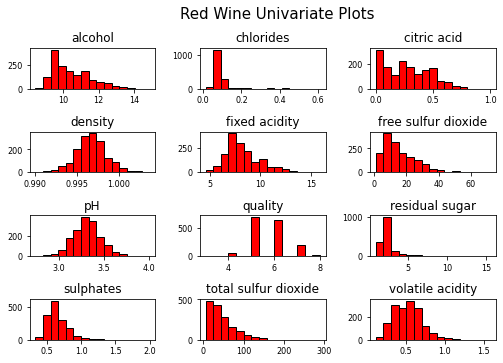

In [35]:
red_wine.hist(bins=15, color='red', edgecolor='black', linewidth=1.0,
xlabelsize=8, ylabelsize=8, grid=False)

plt.tight_layout(rect=(0, 0, 1.2, 1.2))

rt = plt.suptitle('Red Wine Univariate Plots', x=0.65, y=1.25, fontsize=15)

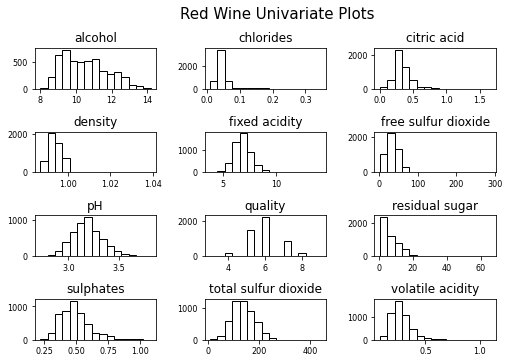

In [36]:
white_wine.hist(bins=15, color='white', edgecolor='black', linewidth=1.0,
xlabelsize=8, ylabelsize=8, grid=False)

plt.tight_layout(rect=(0, 0, 1.2, 1.2))

rt = plt.suptitle('Red Wine Univariate Plots', x=0.65, y=1.25, fontsize=15)

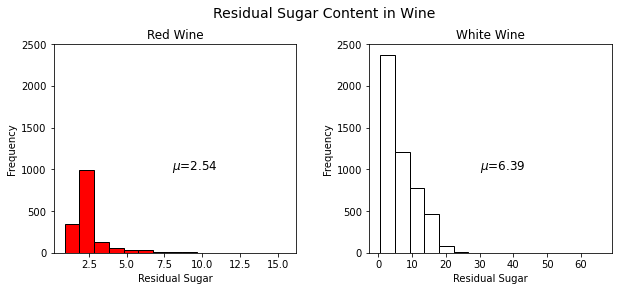

In [37]:
fig = plt.figure(figsize = (10,4))
title = fig.suptitle("Residual Sugar Content in Wine", fontsize=14)
#
#
# next 2 lines 
#
#
fig.subplots_adjust(top=0.85, wspace=0.3)
ax1 = fig.add_subplot(1,2, 1)
ax1.set_title("Red Wine")
ax1.set_xlabel("Residual Sugar")
ax1.set_ylabel("Frequency")
ax1.set_ylim([0, 2500])
ax1.text(8, 1000, r'$\mu$='+str(round(red_wine['residual sugar'].mean(),2)),
fontsize=12)
r_freq, r_bins, r_patches = ax1.hist(red_wine['residual sugar'], color='red', bins=15,
edgecolor='black', linewidth=1)
ax2 = fig.add_subplot(1,2, 2)
ax2.set_title("White Wine")
ax2.set_xlabel("Residual Sugar")
ax2.set_ylabel("Frequency")
ax2.set_ylim([0, 2500])
ax2.text(30, 1000, r'$\mu$='+str(round(white_wine['residual sugar'].mean(),2)),fontsize=12)
w_freq, w_bins, w_patches = ax2.hist(white_wine['residual sugar'], color='white', bins=15,
edgecolor='black', linewidth=1)

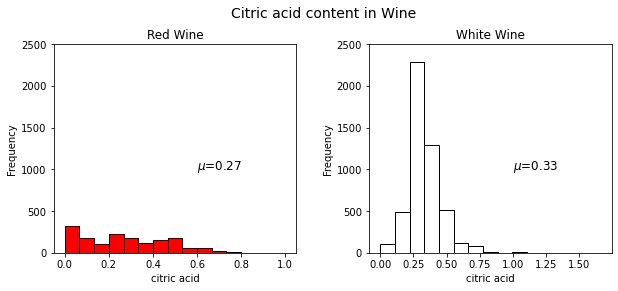

In [38]:
fig = plt.figure(figsize = (10,4))
title = fig.suptitle("Citric acid content in Wine", fontsize=14)
fig.subplots_adjust(top=0.85, wspace=0.3)
ax1 = fig.add_subplot(1,2, 1)
ax1.set_title("Red Wine")
ax1.set_xlabel("citric acid")
ax1.set_ylabel("Frequency")
ax1.set_ylim([0, 2500])
ax1.text(0.6, 1000, r'$\mu$='+str(round(red_wine['citric acid'].mean(),2)),
fontsize=12)
r_freq, r_bins, r_patches = ax1.hist(red_wine['citric acid'], color='red', bins=15,
edgecolor='black', linewidth=1)
ax2 = fig.add_subplot(1,2, 2)
ax2.set_title("White Wine")
ax2.set_xlabel("citric acid")
ax2.set_ylabel("Frequency")
ax2.set_ylim([0, 2500])
ax2.text(1, 1000, r'$\mu$='+str(round(white_wine['citric acid'].mean(),2)),
fontsize=12)
w_freq, w_bins, w_patches = ax2.hist(white_wine['citric acid'], color='white', bins=15,
edgecolor='black', linewidth=1)

In [39]:
from scipy import stats
F, p = stats.f_oneway(wines[wines['quality_label'] == 'low']['alcohol'],
wines[wines['quality_label'] == 'medium']['alcohol'],
wines[wines['quality_label'] == 'high']['alcohol'])
print('ANOVA test for mean alcohol levels across wine samples with different quality ratings')
print('F Statistic:', F, '\tp-value:', p)

ANOVA test for mean alcohol levels across wine samples with different quality ratings
F Statistic: 673.0745347231032 	p-value: 2.2715337450621843e-266


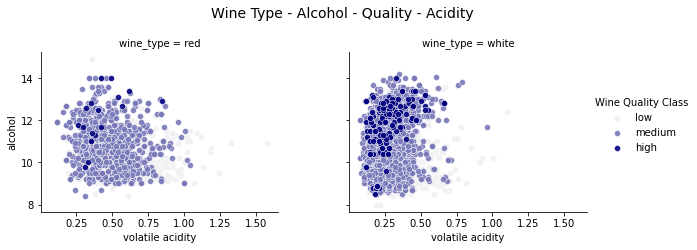

In [40]:
g = sns.FacetGrid(wines, col="wine_type", hue='quality_label',
col_order=['red', 'white'], hue_order=['low', 'medium', 'high'],
aspect=1.2, size=3.5, palette=sns.light_palette('navy', 3))
g.map(plt.scatter, "volatile acidity", "alcohol", alpha=0.9,
edgecolor='white', linewidth=0.5)
fig = g.fig
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Alcohol - Quality - Acidity', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

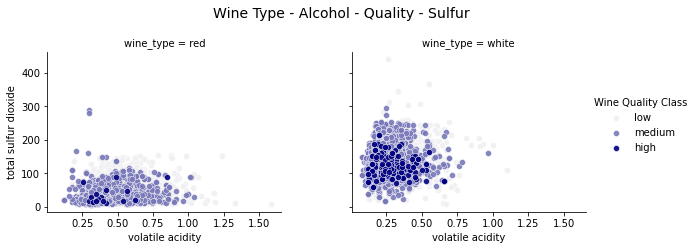

In [41]:
g = sns.FacetGrid(wines, col="wine_type", hue='quality_label',
col_order=['red', 'white'], hue_order=['low', 'medium', 'high'],
aspect=1.2, size=3.5, palette=sns.light_palette('navy', 3))
g.map(plt.scatter, "volatile acidity", "total sulfur dioxide", alpha=0.9,edgecolor='white', linewidth=0.5)
fig = g.fig
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Alcohol - Quality - Sulfur', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

Text(0.5, 1.0, '')

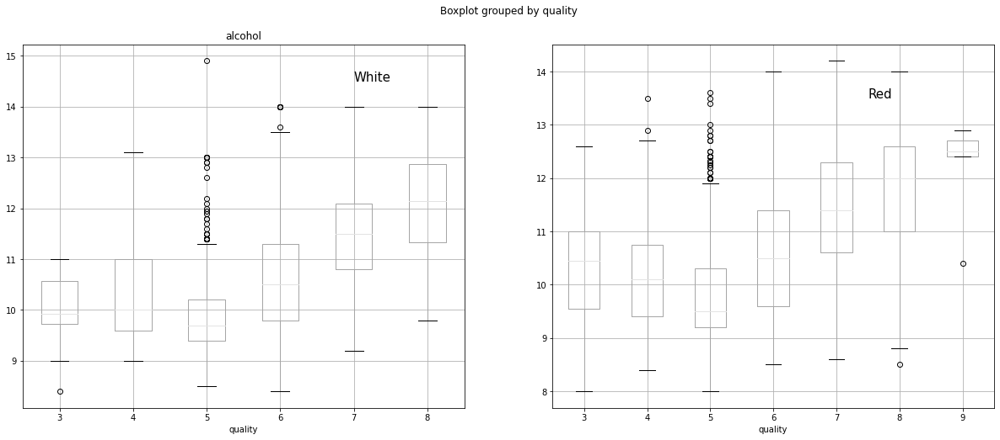

In [42]:
fig, axs = plt.subplots(ncols=2,figsize=(20,8))
title = fig.suptitle("Red and White qualit over alcohol", fontsize=14)
red_wine.boxplot(column = 'alcohol', by = 'quality', ax=axs[0]);
white_wine.boxplot(column = 'alcohol', by = 'quality', ax=axs[1])
axs[1].text(5.5, 13.5,r"Red",fontsize=15)
axs[0].text(5, 14.5,r"White",fontsize=15)
plt.title('')

In [43]:
axs[0]

In [44]:
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label
0,7.0,0.25,0.45,2.3,0.045,40.0,118.0,0.99064,3.16,0.48,11.9,7,white,medium
1,7.6,0.14,0.74,1.6,0.040,27.0,103.0,0.99160,3.07,0.40,10.8,7,white,medium
2,6.2,0.15,0.27,11.0,0.035,46.0,116.0,0.99602,3.12,0.38,9.1,6,white,medium
3,6.7,0.16,0.32,12.5,0.035,18.0,156.0,0.99666,2.88,0.36,9.0,6,white,medium
4,6.8,0.27,0.22,17.8,0.034,16.0,116.0,0.99890,3.07,0.53,9.2,5,white,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.3,0.24,0.29,13.7,0.035,53.0,134.0,0.99567,3.17,0.38,10.6,6,white,medium
6493,6.9,0.36,0.25,2.4,0.098,5.0,16.0,0.99640,3.41,0.60,10.1,6,red,medium
6494,13.4,0.27,0.62,2.6,0.082,6.0,21.0,1.00020,3.16,0.67,9.7,6,red,medium
6495,8.9,0.40,0.51,2.6,0.052,13.0,27.0,0.99500,3.32,0.90,13.4,7,red,medium


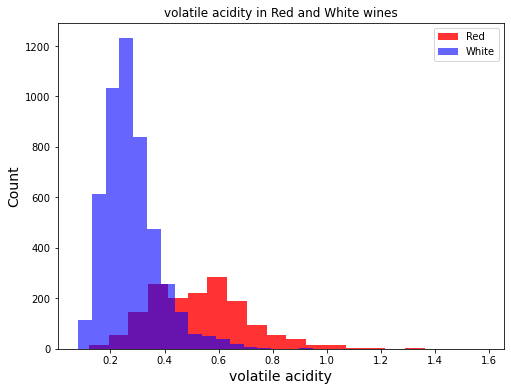

In [45]:
plt.figure(figsize=(8,6))
plt.hist(red_wine["volatile acidity"], bins=20,alpha=0.8, label="Red", color="Red")
plt.hist(white_wine["volatile acidity"], bins=20, alpha=0.6, label="White", color="Blue")

plt.xlabel("volatile acidity", size=14)
plt.ylabel("Count", size=14)
plt.title("volatile acidity in Red and White wines")
plt.legend(loc='upper right')
plt.savefig("volatile_acidity_in_Red_and_White_wines")

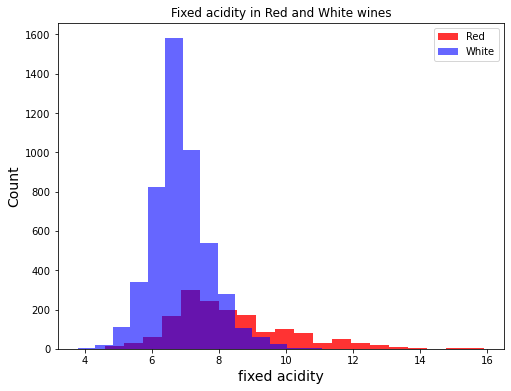

In [46]:
plt.figure(figsize=(8,6))
plt.hist(red_wine["fixed acidity"], bins=20,alpha=0.8, label="Red", color="Red")
plt.hist(white_wine["fixed acidity"], bins=20, alpha=0.6, label="White", color="Blue")

plt.xlabel("fixed acidity", size=14)
plt.ylabel("Count", size=14)
plt.title("Fixed acidity in Red and White wines")
plt.legend(loc='upper right')
plt.savefig("fixed_acidity_in_Red_and_White_wines")

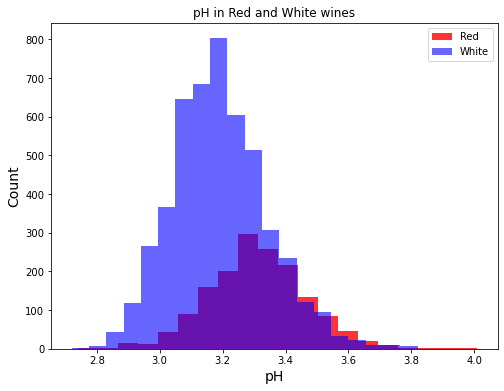

In [47]:
plt.figure(figsize=(8,6))
plt.hist(red_wine["pH"], bins=20,alpha=0.8, label="Red", color="Red")
plt.hist(white_wine["pH"], bins=20, alpha=0.6, label="White", color="Blue")

plt.xlabel("pH", size=14)
plt.ylabel("Count", size=14)
plt.title("pH in Red and White wines")
plt.legend(loc='upper right')
plt.savefig("pH_in_Red_and_White_wines")

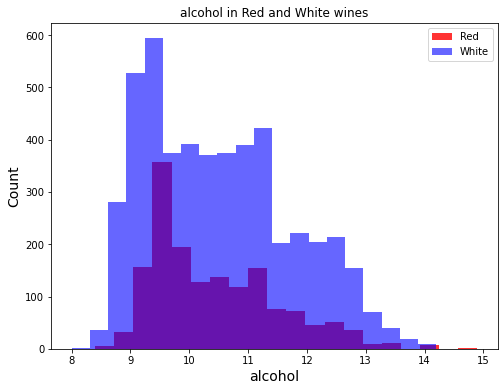

In [48]:
plt.figure(figsize=(8,6))
plt.hist(red_wine["alcohol"], bins=20,alpha=0.8, label="Red", color="Red")
plt.hist(white_wine["alcohol"], bins=20, alpha=0.6, label="White", color="Blue")

plt.xlabel("alcohol", size=14)
plt.ylabel("Count", size=14)
plt.title("alcohol in Red and White wines")
plt.legend(loc='upper right')
plt.savefig("alcohol_in_Red_and_White_wines")

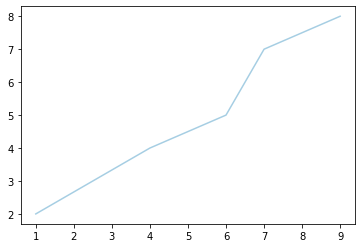

In [49]:
x= [1,4,6,7,9]
y=[2,4,5,7,8]
plt.plot(x, y)
plt.show()

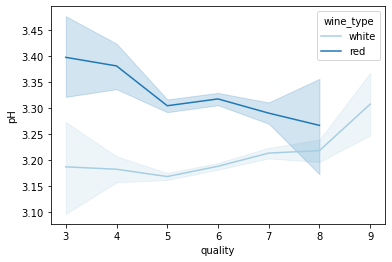

In [50]:
sns.lineplot(x="quality",y="pH", data=wines, hue="wine_type")



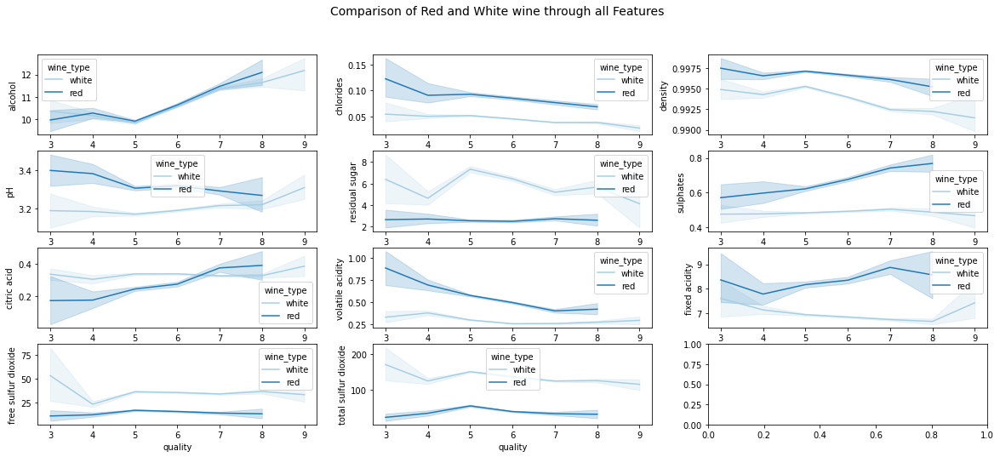

In [51]:
fig, axs = plt.subplots(nrows=4, ncols=3,figsize=(20,8))
title = fig.suptitle("Comparison of Red and White wine through all Features", fontsize=14)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
sns.set_palette(sns.color_palette("Paired"))
sns.lineplot(x="quality",y="alcohol",data=wines, hue="wine_type", ax=axs[0,0])
sns.lineplot(x="quality",y="chlorides",data=wines, hue="wine_type", ax=axs[0,1])
sns.lineplot(x="quality",y="density",data=wines, hue="wine_type", ax=axs[0,2])
sns.lineplot(x="quality",y="pH",data=wines, hue="wine_type", ax=axs[1,0])
sns.lineplot(x="quality",y="residual sugar",data=wines, hue="wine_type", ax=axs[1,1])
sns.lineplot(x="quality",y="sulphates",data=wines, hue="wine_type", ax=axs[1,2])
sns.lineplot(x="quality",y="citric acid",data=wines, hue="wine_type", ax=axs[2,0])
sns.lineplot(x="quality",y="volatile acidity",data=wines, hue="wine_type", ax=axs[2,1])
sns.lineplot(x="quality",y="fixed acidity",data=wines, hue="wine_type", ax=axs[2,2])
sns.lineplot(x="quality",y="free sulfur dioxide",data=wines, hue="wine_type", ax=axs[3,0])
sns.lineplot(x="quality",y="total sulfur dioxide",data=wines, hue="wine_type", ax=axs[3,1])

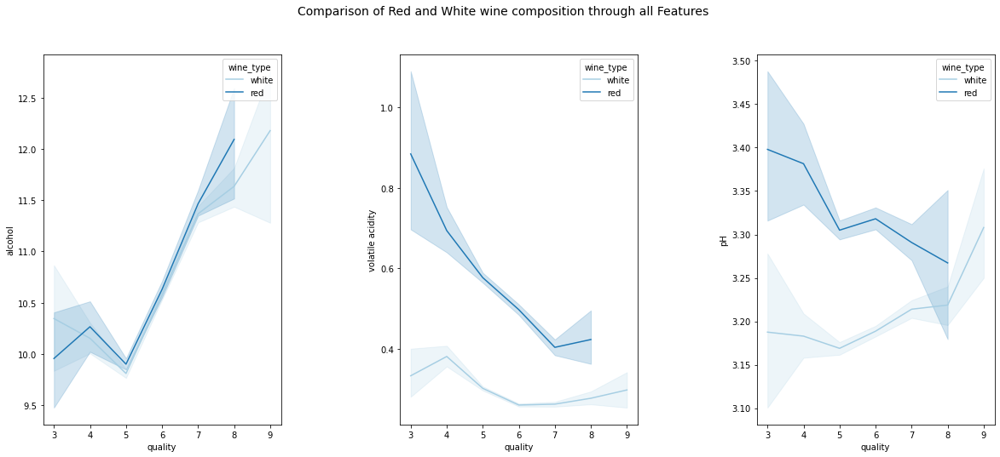

In [52]:
fig, axs = plt.subplots(ncols=3,figsize=(20,8))
title = fig.suptitle("Comparison of Red and White wine composition through all Features", fontsize=14)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=None)
sns.set_palette(sns.color_palette("Paired"))
sns.lineplot(x="quality",y="alcohol",data=wines, hue="wine_type", ax=axs[0])
sns.lineplot(x="quality",y="volatile acidity",data=wines, hue="wine_type", ax=axs[1])
sns.lineplot(x="quality",y="pH",data=wines, hue="wine_type", ax=axs[2])

In [53]:
des = pd.merge(red_wine.describe(), white_wine.describe(),left_index=True, right_index=True, suffixes=(' R', ' W')).T
des = des.sort_index()
des


,count,mean,std,min,25%,50%,75%,max
alcohol R,1599.0,10.422983,1.065668,8.40000,9.500000,10.20000,11.100000,14.90000
alcohol W,4898.0,10.514267,1.230621,8.00000,9.500000,10.40000,11.400000,14.20000
chlorides R,1599.0,0.087467,0.047065,0.01200,0.070000,0.07900,0.090000,0.61100
chlorides W,4898.0,0.045772,0.021848,0.00900,0.036000,0.04300,0.050000,0.34600
citric acid R,1599.0,0.270976,0.194801,0.00000,0.090000,0.26000,0.420000,1.00000
citric acid W,4898.0,0.334192,0.121020,0.00000,0.270000,0.32000,0.390000,1.66000
density R,1599.0,0.996747,0.001887,0.99007,0.995600,0.99675,0.997835,1.00369
density W,4898.0,0.994027,0.002991,0.98711,0.991723,0.99374,0.996100,1.03898
fixed acidity R,1599.0,8.319637,1.741096,4.60000,7.100000,7.90000,9.200000,15.90000
fixed acidity W,4898.0,6.854788,0.843868,3.80000,6.300000,6.80000,7.300000,14.20000


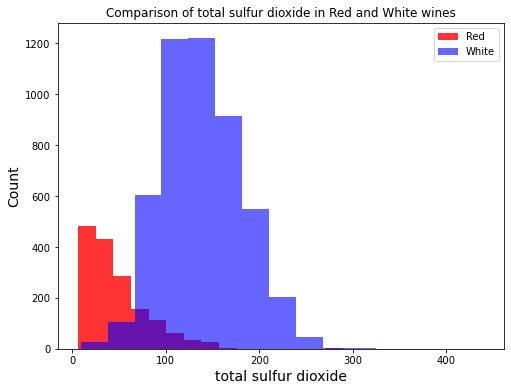

In [54]:
plt.figure(figsize=(8,6))
plt.hist(red_wine["total sulfur dioxide"], bins=15,alpha=0.8, label="Red", color="Red")
plt.hist(white_wine["total sulfur dioxide"], bins=15, alpha=0.6, label="White", color="Blue")

plt.xlabel("total sulfur dioxide", size=14)
plt.ylabel("Count", size=14)
plt.title("Comparison of total sulfur dioxide in Red and White wines")
plt.legend(loc='upper right')
plt.savefig("total_sulfur_dioxide_in_Red_and_White_wines")

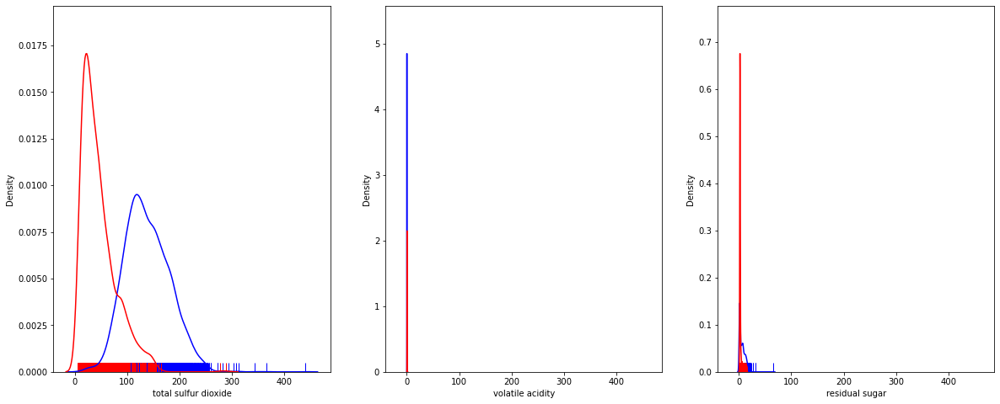

In [55]:
f, axs = plt.subplots(ncols=3, figsize=(20, 8), sharex=True)
title = fig.suptitle("Composition differences of Red and White wine", fontsize=14)
#sns.lineplot(x="total sulfur dioxide",y=wines.index,data=wines, hue="wine_type", ax=axs[0])
#sns.distplot(wines["total sulfur dioxide"], color="red", ax=axs[0])
#sns.distplot(wines["total sulfur dioxide"] , color="skyblue", ax=axs[1])
sns.distplot(white_wine["total sulfur dioxide"],color="blue", hist=False, rug=True, ax=axs[0])
sns.distplot(red_wine["total sulfur dioxide"],color="red", hist=False, rug=True, ax=axs[0])
sns.distplot(white_wine["volatile acidity"],color="blue", hist=False, rug=True, ax=axs[1])
sns.distplot(red_wine["volatile acidity"],color="red", hist=False, rug=True, ax=axs[1])
sns.distplot(white_wine["residual sugar"],color="blue", hist=False, rug=True, ax=axs[2])
sns.distplot(red_wine["residual sugar"],color="red", hist=False, rug=True, ax=axs[2])


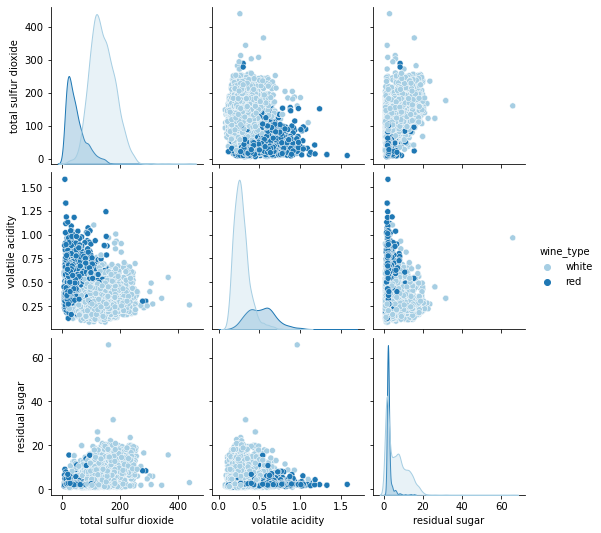

In [56]:
comp_w= wines[["total sulfur dioxide","volatile acidity","residual sugar","wine_type"]]
sns.pairplot(comp_w,hue="wine_type")

In [57]:
wines.sort_values(by="quality_label", ascending=False)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label
0,7.0,0.250,0.45,2.30,0.045,40.0,118.0,0.99064,3.16,0.48,11.9,7,white,medium
2930,15.6,0.685,0.76,3.70,0.100,6.0,43.0,1.00320,2.95,0.68,11.2,7,red,medium
2932,8.3,0.180,0.30,1.10,0.033,20.0,57.0,0.99109,3.02,0.51,11.0,6,white,medium
2934,6.3,0.270,0.46,11.75,0.037,61.0,212.0,0.99710,3.25,0.53,9.5,6,white,medium
5288,5.1,0.260,0.34,6.40,0.034,26.0,99.0,0.99449,3.23,0.41,9.2,6,white,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2882,5.2,0.440,0.04,1.40,0.036,43.0,119.0,0.98940,3.36,0.33,12.1,8,white,high
637,6.6,0.160,0.32,1.40,0.035,49.0,186.0,0.99060,3.35,0.64,12.4,8,white,high
4049,6.8,0.260,0.42,1.70,0.049,41.0,122.0,0.99300,3.47,0.48,10.5,8,white,high
2872,7.3,0.190,0.27,13.90,0.057,45.0,155.0,0.99807,2.94,0.41,8.8,8,white,high


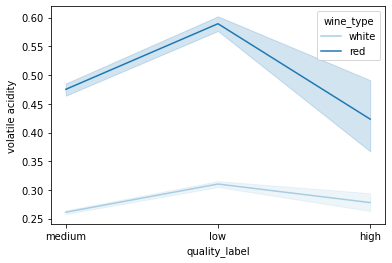

In [58]:

sns.lineplot(x="quality_label",y="volatile acidity",data=wines, hue="wine_type")

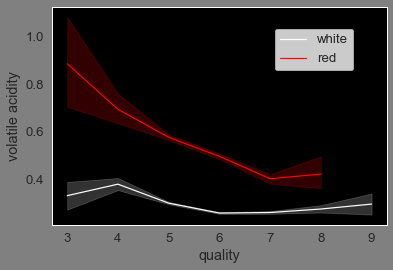

In [59]:
palette = ["white", "red"]
#sns.set_palette(palette)
#sns.set_style("dark")
#"legend.facecolor":"white"
#new_style={"grid":False}
# aggiustamento colori
sns.set(context="paper", font_scale=1.5,rc={'axes.facecolor':'black','axes.grid' : False,'figure.facecolor':"grey", "legend.facecolor":"white"}, palette=palette)
sns.lineplot(x="quality",y="volatile acidity",data=wines, hue="wine_type")
# posizione legenda
plt.legend(bbox_to_anchor=(0.9, 0.9),borderaxespad=0)

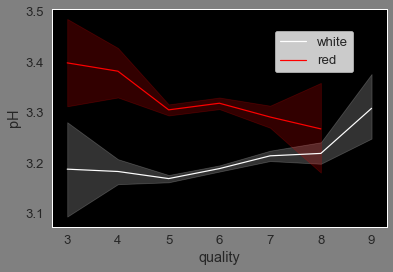

In [60]:
palette = ["white", "red"]
#sns.set_palette(palette)
#sns.set_style("dark")
#"legend.facecolor":"white"
#new_style={"grid":False}
# aggiustamento colori
sns.set(context="paper", font_scale=1.5,rc={'axes.facecolor':'black','axes.grid' : False,'figure.facecolor':"grey"}, palette=palette)
sns.lineplot(x="quality",y="pH",data=wines, hue="wine_type")
# posizione legenda
plt.legend(bbox_to_anchor=(0.9, 0.9),borderaxespad=0)

In [61]:
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label
0,7.0,0.25,0.45,2.3,0.045,40.0,118.0,0.99064,3.16,0.48,11.9,7,white,medium
1,7.6,0.14,0.74,1.6,0.040,27.0,103.0,0.99160,3.07,0.40,10.8,7,white,medium
2,6.2,0.15,0.27,11.0,0.035,46.0,116.0,0.99602,3.12,0.38,9.1,6,white,medium
3,6.7,0.16,0.32,12.5,0.035,18.0,156.0,0.99666,2.88,0.36,9.0,6,white,medium
4,6.8,0.27,0.22,17.8,0.034,16.0,116.0,0.99890,3.07,0.53,9.2,5,white,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.3,0.24,0.29,13.7,0.035,53.0,134.0,0.99567,3.17,0.38,10.6,6,white,medium
6493,6.9,0.36,0.25,2.4,0.098,5.0,16.0,0.99640,3.41,0.60,10.1,6,red,medium
6494,13.4,0.27,0.62,2.6,0.082,6.0,21.0,1.00020,3.16,0.67,9.7,6,red,medium
6495,8.9,0.40,0.51,2.6,0.052,13.0,27.0,0.99500,3.32,0.90,13.4,7,red,medium


In [62]:
red_wine["Total acidity"] = red_wine['fixed acidity'] + red_wine['volatile acidity'] + red_wine['citric acid']
red_wine
white_wine["Total acidity"] = white_wine['fixed acidity'] + white_wine['volatile acidity'] + white_wine['citric acid']
white_wine


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label,Total acidity
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,white,medium,7.63
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,white,medium,6.94
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,white,medium,8.78
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,white,medium,7.75
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,white,medium,7.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white,medium,6.70
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white,low,7.28
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white,medium,6.93
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white,medium,6.09


In [63]:
wines["Total acidity"] = wines['fixed acidity'] + wines['volatile acidity'] + wines['citric acid']
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label,Total acidity
0,7.0,0.25,0.45,2.3,0.045,40.0,118.0,0.99064,3.16,0.48,11.9,7,white,medium,7.70
1,7.6,0.14,0.74,1.6,0.040,27.0,103.0,0.99160,3.07,0.40,10.8,7,white,medium,8.48
2,6.2,0.15,0.27,11.0,0.035,46.0,116.0,0.99602,3.12,0.38,9.1,6,white,medium,6.62
3,6.7,0.16,0.32,12.5,0.035,18.0,156.0,0.99666,2.88,0.36,9.0,6,white,medium,7.18
4,6.8,0.27,0.22,17.8,0.034,16.0,116.0,0.99890,3.07,0.53,9.2,5,white,low,7.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.3,0.24,0.29,13.7,0.035,53.0,134.0,0.99567,3.17,0.38,10.6,6,white,medium,6.83
6493,6.9,0.36,0.25,2.4,0.098,5.0,16.0,0.99640,3.41,0.60,10.1,6,red,medium,7.51
6494,13.4,0.27,0.62,2.6,0.082,6.0,21.0,1.00020,3.16,0.67,9.7,6,red,medium,14.29
6495,8.9,0.40,0.51,2.6,0.052,13.0,27.0,0.99500,3.32,0.90,13.4,7,red,medium,9.81


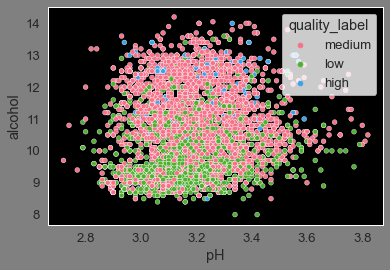

In [64]:
sns.scatterplot(data=white_wine, x="pH", y="alcohol", hue="quality_label")

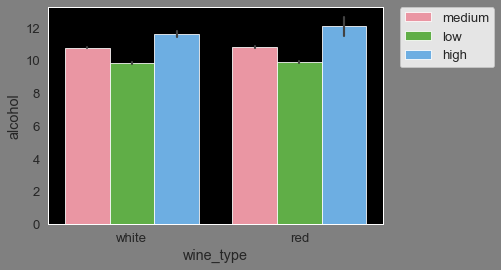

In [65]:
sns.barplot(x="wine_type",y="alcohol",data=wines, hue="quality_label")
plt.legend(bbox_to_anchor=(1.05, 1),borderaxespad=0)

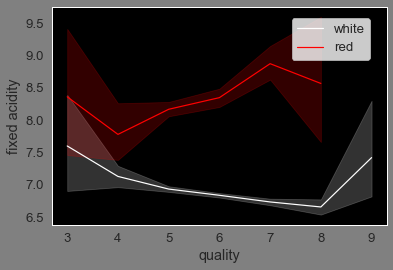

In [66]:
palette = ["white", "red"]
#sns.set_palette(palette)
#sns.set_style("dark")
#"legend.facecolor":"white"
#new_style={"grid":False}
# aggiustamento colori
sns.set(context="paper", font_scale=1.5,rc={'axes.facecolor':'black','axes.grid' : False,'figure.facecolor':"grey"}, palette=palette)
sns.lineplot(x="quality",y="fixed acidity",data=wines, hue="wine_type")
# posizione legenda
plt.legend(bbox_to_anchor=(0.95, 0.95),borderaxespad=0)
fig.savefig('fixed acidity.png', dpi=400)



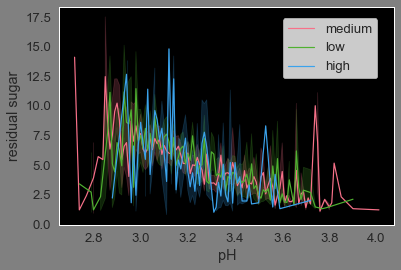

In [67]:
palette = ["white", "red"]
#sns.set_palette(palette)
#sns.set_style("dark")
#"legend.facecolor":"white"
#new_style={"grid":False}
# aggiustamento colori
sns.set(context="paper", font_scale=1.5,rc={'axes.facecolor':'black','axes.grid' : False,'figure.facecolor':"grey"}, palette=palette)
sns.lineplot(x="pH",y="residual sugar",data=wines, hue="quality_label")
# posizione legenda
plt.legend(bbox_to_anchor=(0.95, 0.95),borderaxespad=0)

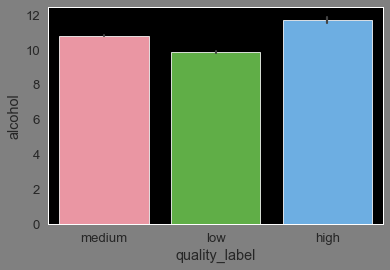

In [68]:
title = fig.suptitle("Comparison of Red and White wine through all Features", fontsize=14)
sns.barplot(x="quality_label",y="alcohol",data=wines);

In [69]:
sorter = ['low', 'medium', 'high']

# Create the dictionary that defines the order for sorting
sorterIndex = dict(zip(sorter, range(len(sorter))))

# Generate a rank column that will be used to sort
# the dataframe numerically
wines['quality_rank'] = wines['quality_label'].map(sorterIndex)

# Here is the result asked with the lexicographic sort
# Result may be hard to analyze, so a second sorting is
# proposed next
## NOTE: 
## Newer versions of pandas use 'sort_values' instead of 'sort'
wines.sort_values(['quality_rank'],
        ascending = [True], inplace = True)

wines.drop(columns = "quality_rank", inplace = True )
wines


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label,Total acidity
3248,10.6,0.28,0.39,15.50,0.069,6.0,23.0,1.00260,3.12,0.66,9.2,5,red,low,11.27
2308,6.1,0.64,0.02,2.40,0.069,26.0,46.0,0.99358,3.47,0.45,11.0,5,red,low,6.76
2309,6.7,0.18,0.25,14.30,0.048,79.0,149.0,0.99750,3.12,0.37,9.7,5,white,low,7.13
2311,5.7,0.28,0.24,17.50,0.044,60.0,167.0,0.99890,3.31,0.44,9.4,5,white,low,6.22
2312,8.2,0.21,0.48,1.40,0.041,11.0,99.0,0.99580,3.17,0.57,9.9,5,white,low,8.89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3701,6.5,0.36,0.28,3.20,0.037,29.0,119.0,0.99080,3.25,0.65,12.4,8,white,high,7.14
240,6.8,0.19,0.32,7.05,0.019,54.0,188.0,0.99350,3.25,0.37,11.1,8,white,high,7.31
5048,5.6,0.21,0.40,1.30,0.041,81.0,147.0,0.99010,3.22,0.95,11.6,8,white,high,6.21
5323,6.2,0.37,0.24,6.10,0.032,19.0,86.0,0.98934,3.04,0.26,13.4,8,white,high,6.81


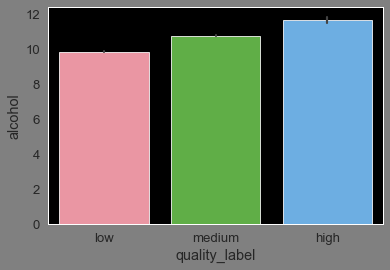

In [70]:
title = fig.suptitle("Comparison of Red and White wine through all Features", fontsize=14)
sns.barplot(x="quality_label",y="alcohol",data=wines);

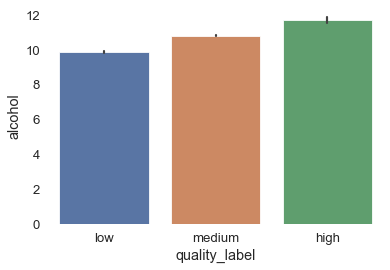

In [71]:
#palette = ["white", "red"]
#sns.set_palette(palette)
#sns.set_style("dark")
#"legend.facecolor":"white"
#new_style={"grid":False}
# aggiustamento colori
sns.set(context="paper", font_scale=1.5,rc={'axes.facecolor':'white','axes.grid' : False,'figure.facecolor':"white"})
# posizione legenda

sns.barplot(x="quality_label",y="alcohol",data=wines);

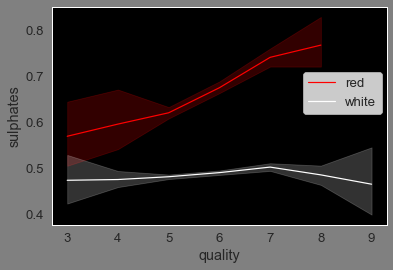

In [72]:
palette = ["red", "white"]
#sns.set_palette(palette)
#sns.set_style("dark")
#"legend.facecolor":"white"
#new_style={"grid":False}
# aggiustamento colori
sns.set(context="paper", font_scale=1.5,rc={'axes.facecolor':'black','axes.grid' : False,'figure.facecolor':"grey"}, palette=palette)
sns.lineplot(x="quality",y="sulphates",data=wines, hue="wine_type")
# posizione legenda
plt.legend(bbox_to_anchor=(0.75, 0.7),borderaxespad=0)

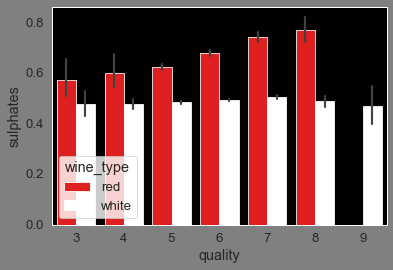

In [73]:
sns.barplot(x="quality", y="sulphates", data=wines, hue= "wine_type" )

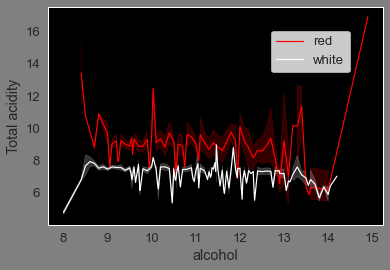

In [74]:
palette = ["red", "white"]
#sns.set_palette(palette)
#sns.set_style("dark")
#"legend.facecolor":"white"
#new_style={"grid":False}
# aggiustamento colori
sns.set(context="paper", font_scale=1.5,rc={'axes.facecolor':'black','axes.grid' : False,'figure.facecolor':"grey"}, palette=palette)
sns.lineplot(x="alcohol",y="Total acidity",data=wines, hue="wine_type")
# posizione legenda
plt.legend(bbox_to_anchor=(0.9, 0.7),borderaxespad=0)

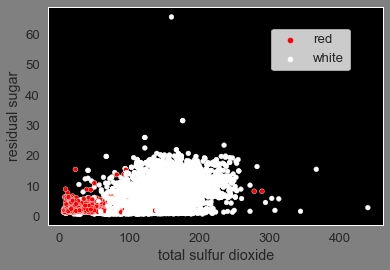

In [75]:
palette = ["red", "white"]
#sns.set_palette(palette)
#sns.set_style("dark")
#"legend.facecolor":"white"
#new_style={"grid":False}
# aggiustamento colori
sns.set(context="paper", font_scale=1.5,rc={'axes.facecolor':'black','axes.grid' : False,'figure.facecolor':"grey", "legend.facecolor":"white"}, palette=palette)
sns.scatterplot(x="total sulfur dioxide",y="residual sugar",data=wines, hue="wine_type")
# posizione legenda
plt.legend(bbox_to_anchor=(0.9, 0.9),borderaxespad=0)

In [76]:
wines

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type,quality_label,Total acidity
3248,10.6,0.28,0.39,15.50,0.069,6.0,23.0,1.00260,3.12,0.66,9.2,5,red,low,11.27
2308,6.1,0.64,0.02,2.40,0.069,26.0,46.0,0.99358,3.47,0.45,11.0,5,red,low,6.76
2309,6.7,0.18,0.25,14.30,0.048,79.0,149.0,0.99750,3.12,0.37,9.7,5,white,low,7.13
2311,5.7,0.28,0.24,17.50,0.044,60.0,167.0,0.99890,3.31,0.44,9.4,5,white,low,6.22
2312,8.2,0.21,0.48,1.40,0.041,11.0,99.0,0.99580,3.17,0.57,9.9,5,white,low,8.89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3701,6.5,0.36,0.28,3.20,0.037,29.0,119.0,0.99080,3.25,0.65,12.4,8,white,high,7.14
240,6.8,0.19,0.32,7.05,0.019,54.0,188.0,0.99350,3.25,0.37,11.1,8,white,high,7.31
5048,5.6,0.21,0.40,1.30,0.041,81.0,147.0,0.99010,3.22,0.95,11.6,8,white,high,6.21
5323,6.2,0.37,0.24,6.10,0.032,19.0,86.0,0.98934,3.04,0.26,13.4,8,white,high,6.81


In [77]:
#wtp_features = wines.iloc[:,:-3]
#wtp_feature_names = wtp_features.columns
##wtp_class_labels = np.array(wines['wine_type'])
#train_test_split ?e una libreria importata
#wtp_train_X, wtp_test_X, wtp_train_y, wtp_test_y = train_test_split(wtp_features, wtp_class_labels, test_size=0.3, random_state=42)

#print(Counter(wtp_train_y), Counter(wtp_test_y))
#print('Features:', list(wtp_feature_names))

In [78]:
 # Define the scaler
#wtp_ss = StandardScaler().fit(wtp_train_X)
# Scale the train set
#wtp_train_SX = wtp_ss.transform(wtp_train_X)
# Scale the test set
#wtp_test_SX = wtp_ss.transform(wtp_test_X)

In [79]:
#Counter(wines["wine_type"])

In [80]:
wines = wines.astype({"quality_label":'category'})
wines.dtypes



fixed acidity            float64
volatile acidity         float64
citric acid              float64
residual sugar           float64
chlorides                float64
free sulfur dioxide      float64
total sulfur dioxide     float64
density                  float64
pH                       float64
sulphates                float64
alcohol                  float64
quality                    int64
wine_type                 object
quality_label           category
Total acidity            float64
dtype: object

In [81]:
wines.corr()['quality'].sort_values(ascending = False)

quality                 1.000000
alcohol                 0.444319
citric acid             0.085532
free sulfur dioxide     0.055463
sulphates               0.038485
pH                      0.019506
residual sugar         -0.036980
total sulfur dioxide   -0.041385
fixed acidity          -0.076743
Total acidity          -0.094240
chlorides              -0.200666
volatile acidity       -0.265699
density                -0.305858
Name: quality, dtype: float64

In [82]:

wines.drop(columns = ["Total acidity"], inplace= True)

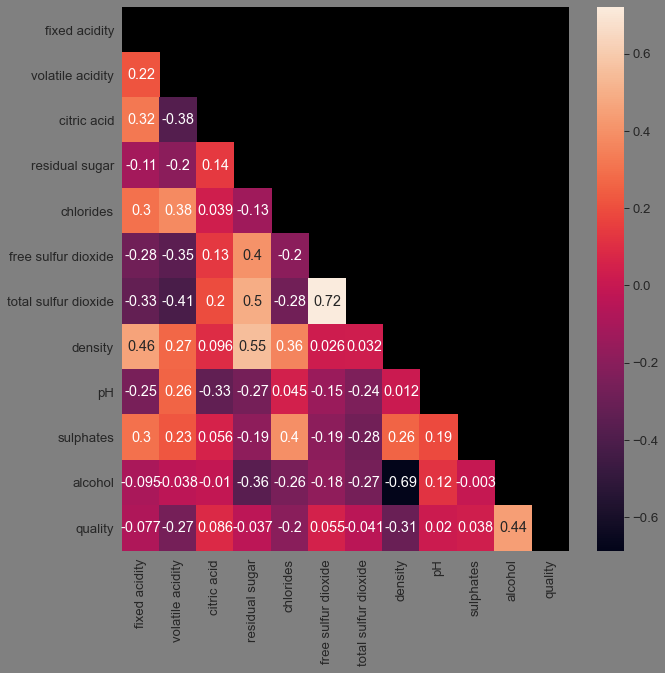

In [83]:
plt.figure(figsize=(10, 10))
mask = np.triu(np.ones_like(wines.corr(), dtype=bool))
plot = sns.heatmap(wines.corr(), annot= True, mask=mask);

In [84]:
X = wines.drop(columns = ['quality', 'quality_label' , 'density'])
y = wines['quality_label']
X = pd.get_dummies(X)
X
#from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler()
#print(scaler.fit(X))
#X = scaler.transform(X)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,pH,sulphates,alcohol,wine_type_red,wine_type_white
3248,10.6,0.28,0.39,15.50,0.069,6.0,23.0,3.12,0.66,9.2,1,0
2308,6.1,0.64,0.02,2.40,0.069,26.0,46.0,3.47,0.45,11.0,1,0
2309,6.7,0.18,0.25,14.30,0.048,79.0,149.0,3.12,0.37,9.7,0,1
2311,5.7,0.28,0.24,17.50,0.044,60.0,167.0,3.31,0.44,9.4,0,1
2312,8.2,0.21,0.48,1.40,0.041,11.0,99.0,3.17,0.57,9.9,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3701,6.5,0.36,0.28,3.20,0.037,29.0,119.0,3.25,0.65,12.4,0,1
240,6.8,0.19,0.32,7.05,0.019,54.0,188.0,3.25,0.37,11.1,0,1
5048,5.6,0.21,0.40,1.30,0.041,81.0,147.0,3.22,0.95,11.6,0,1
5323,6.2,0.37,0.24,6.10,0.032,19.0,86.0,3.04,0.26,13.4,0,1


In [85]:
#X = pd.get_dummies(X)

In [86]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.20, random_state=42)

In [87]:
X_test.shape

(1300, 12)

In [88]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(random_state=0)
lr.fit(X_train, y_train)
lr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 0,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [89]:
lr.predict(X_test)

array(['medium', 'medium', 'medium', ..., 'medium', 'medium', 'medium'],
      dtype=object)

In [90]:
score = lr.score(X_test, y_test)
print('Test Accuracy Score', score)

Test Accuracy Score 0.6938461538461539


In [91]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, lr.predict(X_test))

array([[  0,   2,  30],
       [  0, 231, 256],
       [  1, 109, 671]], dtype=int64)